In [32]:
import geopandas as gpd
import glob

import matplotlib.pyplot as plt

import folium
from folium.plugins import Geocoder

import branca.colormap as cm
from collections import defaultdict
import webbrowser
from folium.plugins import HeatMap 

import mapclassify

In [33]:
from pathlib import Path

current_dir = Path().resolve()
parent_dir = current_dir.parent
processed_data_folder = parent_dir/ 'semi_processed_data'

In [34]:
gdf_2020 = gpd.read_file(processed_data_folder / '2020_official_geojson.geojson')
print(gdf_2020.shape)
print('------')
gdf_2024 = gpd.read_file(processed_data_folder / '2024_unofficial_geojson.geojson')
print(gdf_2024.shape)


(4269, 8)
------
(4090, 8)


In [35]:
gdf_2024.iloc[:, 3:7] = gdf_2024.iloc[:, 3:7].astype(float)
gdf_2024.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4090 entries, 0 to 4089
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   assembly_district  4090 non-null   object  
 1   election_district  4090 non-null   object  
 2   county             4090 non-null   object  
 3   harris_total       4090 non-null   object  
 4   harris_share       4090 non-null   float64 
 5   trump_total        4090 non-null   object  
 6   trump_share        4090 non-null   float64 
 7   geometry           4090 non-null   geometry
dtypes: float64(2), geometry(1), object(5)
memory usage: 255.8+ KB


In [36]:
combined_gdf = gdf_2024.merge(gdf_2020, how='left', on='election_district', suffixes=('_2024', '_2020')).drop(columns=['geometry_2024', 'county_2024']).rename(columns={'county_2024': 'county',
                                                                                                                                                                        'geometry_2020':'geometry',
                                                                                                                                                                        'election_district':'voting_precinct'
                                                                                                                                                                        })

combined_gdf = combined_gdf[['assembly_district', 'county_2020',
                              'voting_precinct', 'geometry',
                             'trump_total_2024', 'trump_share_2024',
                             'trump_total_2020', 'trump_share_2020',
                             ]].rename(columns={'county_2020':'county'})

combined_gdf.head()

,assembly_district,county,voting_precinct,geometry,trump_total_2024,trump_share_2024,trump_total_2020,trump_share_2020
0,23,Queens,23001,"POLYGON ((-73.92033 40.56223, -73.92078 40.561...",967.0,0.774840,651.0,0.716172
1,23,Queens,23002,"POLYGON ((-73.91018 40.56493, -73.91039 40.564...",907.0,0.770603,694.0,0.732841
2,23,Queens,23003,"POLYGON ((-73.86287 40.56684, -73.86268 40.566...",318.0,0.773723,636.0,0.730195
3,23,Queens,23004,"POLYGON ((-73.85274 40.57061, -73.85312 40.570...",826.0,0.693535,111.0,0.693750
4,23,Queens,23005,"POLYGON ((-73.84878 40.57206, -73.84887 40.572...",887.0,0.734880,486.0,0.601485


In [37]:
total_cols = combined_gdf[combined_gdf.columns[combined_gdf.columns.str.contains('total')]]

combined_gdf[total_cols.columns] = total_cols.apply(lambda col: col.astype('Int64'))

combined_gdf.head()

,assembly_district,county,voting_precinct,geometry,trump_total_2024,trump_share_2024,trump_total_2020,trump_share_2020
0,23,Queens,23001,"POLYGON ((-73.92033 40.56223, -73.92078 40.561...",967,0.774840,651,0.716172
1,23,Queens,23002,"POLYGON ((-73.91018 40.56493, -73.91039 40.564...",907,0.770603,694,0.732841
2,23,Queens,23003,"POLYGON ((-73.86287 40.56684, -73.86268 40.566...",318,0.773723,636,0.730195
3,23,Queens,23004,"POLYGON ((-73.85274 40.57061, -73.85312 40.570...",826,0.693535,111,0.693750
4,23,Queens,23005,"POLYGON ((-73.84878 40.57206, -73.84887 40.572...",887,0.734880,486,0.601485


In [38]:
combined_gdf['trump_share_change'] = combined_gdf.trump_share_2024 - combined_gdf.trump_share_2020

combined_gdf["Trump's gain in vote share"] = combined_gdf['trump_share_change'].apply(lambda x: f"{x *100:.1f}%")

combined_gdf["Trump's vote share in 2020"] = combined_gdf['trump_share_2020'].apply(lambda x: f"{x *100: .1f}%")

combined_gdf["Trump's vote share in 2024"] = combined_gdf['trump_share_2024'].apply(lambda x: f"{x *100:.1f}%")


combined_gdf = gpd.GeoDataFrame(combined_gdf)
combined_gdf = combined_gdf.sort_values('trump_share_change', ascending=False)

combined_gdf.head()

,assembly_district,county,voting_precinct,geometry,trump_total_2024,trump_share_2024,trump_total_2020,trump_share_2020,trump_share_change,Trump's gain in vote share,Trump's vote share in 2020,Trump's vote share in 2024
1181,42,Kings,42054,"POLYGON ((-73.94742 40.62428, -73.94835 40.624...",811,0.954118,32,0.048265,0.905852,90.6%,4.8%,95.4%
1682,50,Kings,50047,"POLYGON ((-73.95444 40.70375, -73.95635 40.702...",364,0.960422,47,0.059873,0.900550,90.1%,6.0%,96.0%
1184,42,Kings,42057,"POLYGON ((-73.94882 40.62169, -73.94975 40.621...",225,0.953390,41,0.063764,0.889626,89.0%,6.4%,95.3%
1755,52,Kings,52001,"POLYGON ((-73.96633 40.70484, -73.96569 40.704...",329,0.950867,42,0.068293,0.882574,88.3%,6.8%,95.1%
1678,50,Kings,50043,"POLYGON ((-73.95571 40.70488, -73.95508 40.704...",330,0.914127,41,0.063863,0.850264,85.0%,6.4%,91.4%


In [39]:
viz_folder = parent_dir /'viz_folder'
print(viz_folder)

/Users/keenansmacbookairm3/Documents/GitHub/nyc_2024/viz_folder


In [40]:
combined_gdf

,assembly_district,county,voting_precinct,geometry,trump_total_2024,trump_share_2024,trump_total_2020,trump_share_2020,trump_share_change,Trump's gain in vote share,Trump's vote share in 2020,Trump's vote share in 2024
1181,42,Kings,42054,"POLYGON ((-73.94742 40.62428, -73.94835 40.624...",811,0.954118,32,0.048265,0.905852,90.6%,4.8%,95.4%
1682,50,Kings,50047,"POLYGON ((-73.95444 40.70375, -73.95635 40.702...",364,0.960422,47,0.059873,0.900550,90.1%,6.0%,96.0%
1184,42,Kings,42057,"POLYGON ((-73.94882 40.62169, -73.94975 40.621...",225,0.953390,41,0.063764,0.889626,89.0%,6.4%,95.3%
1755,52,Kings,52001,"POLYGON ((-73.96633 40.70484, -73.96569 40.704...",329,0.950867,42,0.068293,0.882574,88.3%,6.8%,95.1%
1678,50,Kings,50043,"POLYGON ((-73.95571 40.70488, -73.95508 40.704...",330,0.914127,41,0.063863,0.850264,85.0%,6.4%,91.4%
...,...,...,...,...,...,...,...,...,...,...,...,...
3808,83,NaN,83012,None,79,0.148218,<NA>,NaN,NaN,nan%,nan%,14.8%
3912,84,NaN,84053,None,20,0.198020,<NA>,NaN,NaN,nan%,nan%,19.8%
3959,85,NaN,85035,None,170,0.279605,<NA>,NaN,NaN,nan%,nan%,28.0%
3980,85,NaN,85086,None,6,0.857143,<NA>,NaN,NaN,nan%,nan%,85.7%


In [41]:
from matplotlib.ticker import FuncFormatter

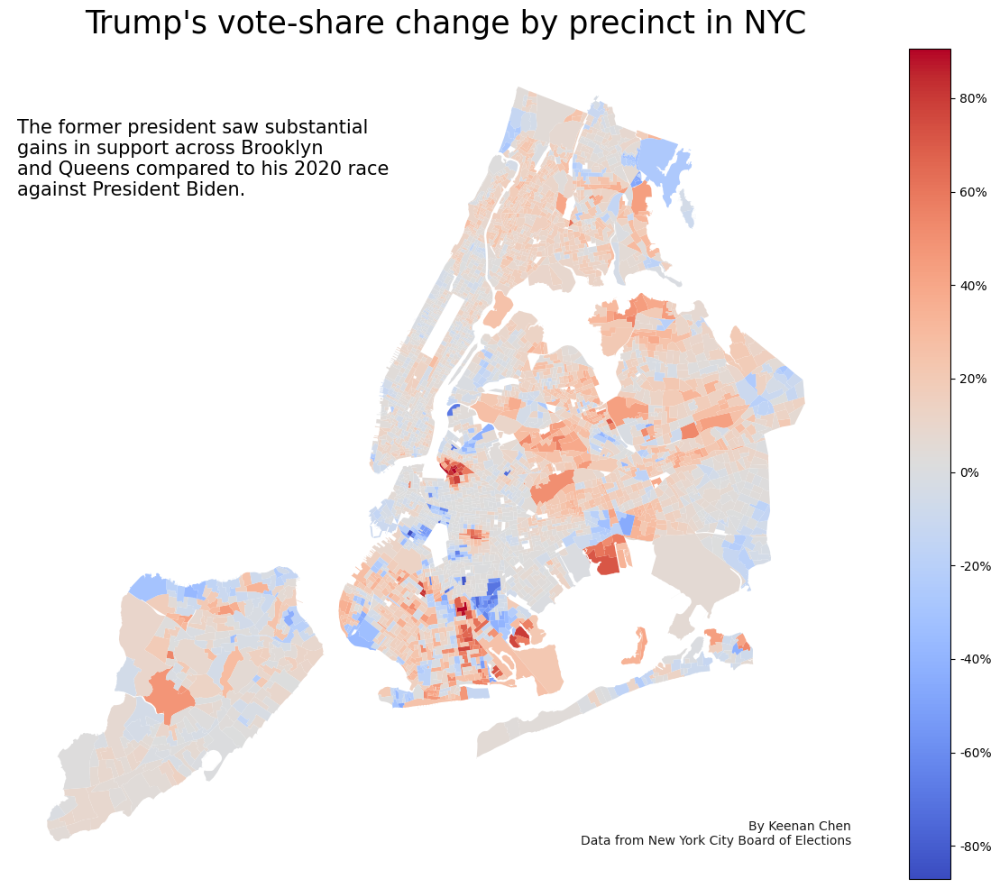

In [42]:

ax = combined_gdf.plot('trump_share_change',
                  cmap='coolwarm',
                  figsize=(15,10),
                  legend=False)

colorbar = ax.get_figure().colorbar(ax.collections[0], ax=ax)
colorbar.formatter = FuncFormatter(lambda x, _: f"{x*100:.0f}%")

plt.axis('off')


plt.suptitle("Trump's vote-share change by precinct in NYC", fontsize=25)
plt.title('The former president saw substantial\ngains in support across Brooklyn\nand Queens compared to his 2020 race\nagainst President Biden.', 
          loc='left', x =0.01, y=0.8,
          fontsize=15, pad=15)


plt.figtext(0.8, 0.05, "By Keenan Chen\nData from New York City Board of Elections", ha='right', va='bottom', fontsize=10, alpha=0.9)

plt.tight_layout()

plt.savefig(viz_folder /'static_nyc_2024_trump_gain.jpeg', dpi=400)
plt.show()

In [43]:
import branca
from matplotlib import cm
import leafmap.foliumap as leafmap

In [44]:
from folium.plugins import Geocoder

In [45]:
combined_gdf.columns

Index(['assembly_district', 'county', 'voting_precinct', 'geometry',
       'trump_total_2024', 'trump_share_2024', 'trump_total_2020',
       'trump_share_2020', 'trump_share_change', 'Trump's gain in vote share',
       'Trump's vote share in 2020', 'Trump's vote share in 2024'],
      dtype='object')

In [46]:
map = folium.Map(location=[40.7128, -74.0060],
                 zoom_start=10.5,
                 width='100%', height='100%',
                  tiles="CartoDB Positron"
                 )

coolwarm = cm.get_cmap('coolwarm')

colormap = branca.colormap.LinearColormap(
    colors=[coolwarm(i) for i in range(0, 256, 32)],
    vmin=combined_gdf['trump_share_change'].min() * 100,  
    vmax=combined_gdf['trump_share_change'].max() * 100,) 

colormap.caption = "Trump's Vote-Share Change 2020-2024 (%)"
colormap.add_to(map)




combined_gdf[['assembly_district', 
             'county', 
             'voting_precinct', 
             'geometry',
             "Trump's gain in vote share",
             "Trump's vote share in 2020", 
             "Trump's vote share in 2024"]].explore(column="Trump's gain in vote share",
                      popup=False, 
                      legend=False,
                      cmap = 'coolwarm',
                      style_kwds=dict(color="black",weight=0.3, opacity=0.3, fillOpacity=0.7),
                      name="Trump's vote-share gain in 2024",
                      m = map
                      )


folium.plugins.Geocoder().add_to(map)

map.save(viz_folder /'cartodb_nyc_2024_trump_20241108.html')
map

In [47]:
# Find voting precincts where Trump received more votes in 2024 than in 2024
combined_gdf["Trump's gain in vote count"] = combined_gdf['trump_total_2024'] - combined_gdf['trump_total_2020']
gain_votes_index = combined_gdf[combined_gdf["Trump's gain in vote count"] > 0].index

# Create a column to identify these precincts
combined_gdf.loc[gain_votes_index, 'more_votes'] = 'yes'

# Save these precincts into a new dataframe
more_votes_df = combined_gdf[combined_gdf.more_votes =='yes']

# Calculate the percentage of precincts where Trump got more votes
combined_gdf[combined_gdf.more_votes.notna()].shape[0]/combined_gdf.shape[0]

0.7562347188264059

In [48]:

map_2 = folium.Map(location=[40.7128, -74.0060],
                 zoom_start=10.5,
                 width='100%', height='100%',
                  tiles="CartoDB Positron"
                 )


coolwarm = cm.get_cmap('Oranges')

colormap = branca.colormap.LinearColormap(
    colors=[coolwarm(i) for i in range(0, 256, 32)],
    vmin=more_votes_df["Trump's gain in vote count"].min(),
    vmax=more_votes_df["Trump's gain in vote count"].max()
)

more_votes_df[['assembly_district', 
             'county', 
             'voting_precinct', 
             'geometry',
              "Trump's gain in vote count"]].explore(column="Trump's gain in vote count",
                     style_kwds=dict(color="white",weight=0.5, opacity=0.3, fillOpacity=0.7),
                      popup=False,
                       legend=False,
                       cmap = 'Oranges',
                       m = map_2)
colormap.caption = "Trump's gain in vote count 2020-2024"
colormap.add_to(map_2)


folium.plugins.Geocoder().add_to(map_2)

map_2.save(viz_folder / 'cartodb_nyc_2024_trump_vote_gain_absolute.html')


map_2